In [1]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
import keras
from keras.preprocessing import image
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
# from keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.applications.mobilenet import MobileNet
from keras.applications.mobilenet import preprocess_input
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from keras.models import Model, Input
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns


In [2]:
#Load base model
base_model = MobileNet(weights='imagenet', include_top=False)

# Add new layers
x = base_model.output
x = GlobalAveragePooling2D()(x)

x = Dense(1024, activation='relu')(x) # we add dense layers so that the model can learn more complex functions and classify for better results.
x = Dense(1024, activation='relu')(x) # dense layer 2
x = Dense(512, activation='relu')(x) # dense layer 3
preds = Dense(3, activation='softmax')(x)

# Assign transfer base model + new layers to model
model = Model(inputs=base_model.input, outputs=preds)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Total params: 5,854,403
Trainable params: 5,832,515
Non-trainable params: 21,888
_________________________________________________________________


In [3]:
# Assign Trainable layers and freeze layer
for layer in model.layers[:20] :
    layer.trainable = False
for layer in model.layers[20:] :
    layer.trainable = True

In [4]:
#create DataGenerator Object
datagen = ImageDataGenerator( rescale=1./255,
                             rotation_range=30, zoom_range=0.5,
                             width_shift_range=0.2, height_shift_range=0.2,
                             shear_range=0.15, horizontal_flip=True,
                             fill_mode="nearest")

# Create Train Image generator
train_generator = datagen.flow_from_directory('./Cat_Dog_Horse/train/', # this is where you specify the path to the main data folder
                                              target_size=(224,224), color_mode='rgb',
                                              batch_size=32,
                                              class_mode='categorical', seed = 508,
                                              shuffle=True)

# Create Validation Image generator
val_generator=datagen.flow_from_directory('./Cat_Dog_Horse/validate/', # this is where you specify the path to the main data folder
                                          target_size=(224,224), color_mode='rgb',
                                          batch_size=16,
                                          class_mode='categorical', seed = 508,
                                          shuffle=True)

Found 175 images belonging to 3 classes.
Found 31 images belonging to 3 classes.


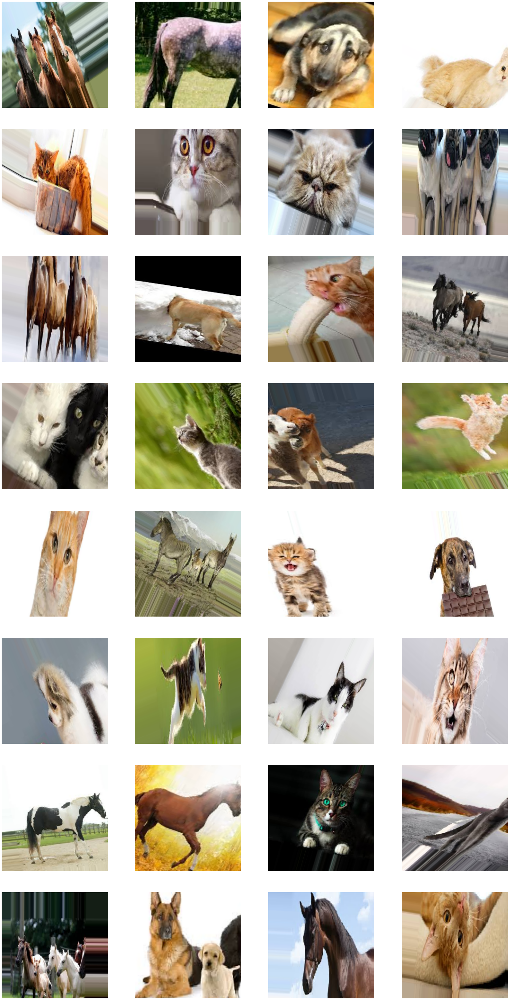

In [5]:
train_batch = train_generator.next()
# print(train_batch)
Img_train = (train_batch[0] * 255)
# print(type(Img_train[0][0][0][0]))

plt.rcParams['figure.figsize'] = [40, int((len(Img_train) / 16) * 40)]

for i in range(len(Img_train)) :
    plt.subplot(len(Img_train) // 4, 4, i + 1)
    plt.imshow(Img_train[i].astype('uint8'))
    plt.axis('off')
    plt.title("")
        
plt.show()

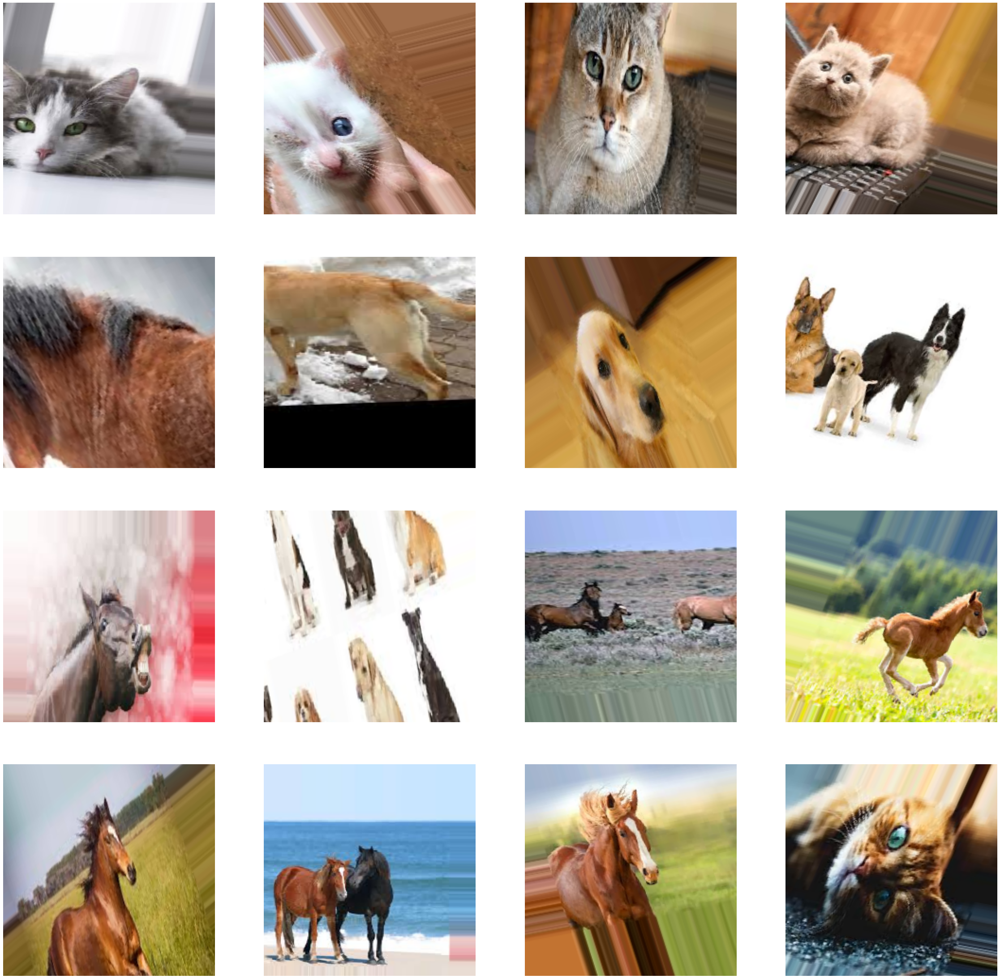

In [6]:
val_batch = val_generator.next()
Img_val = (val_batch[0] * 255)

plt.rcParams['figure.figsize'] = [40, int((len(Img_val) / 16) * 40)]

for i in range(len(Img_val)) :
    plt.subplot(len(Img_val) // 4, 4, i + 1)
    plt.imshow(Img_val[i].astype('uint8'))
    plt.axis('off')
    plt.title("")
        
plt.show()

In [7]:
# Create Optimizer
model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Define training Generator Parameter
EP = 32 # Number of Epoches
step_size_train = train_generator.n // train_generator.batch_size
step_size_val = val_generator.n // val_generator.batch_size

# check step_size_Train = step_size_val -> if not adjust batch_size to make it equal
print(step_size_train, step_size_val)

5 1


In [8]:
history = model.fit_generator(generator=train_generator,
                            steps_per_epoch=step_size_train,
                            validation_data = val_generator,
                            validation_steps = step_size_val,
                            epochs = EP,
                            verbose = 1)


C:\Users\User\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\training.py:1915: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/32
5/5 [==============================] - 22s 616ms/step - loss: 3.1604 - accuracy: 0.3682 - val_loss: 2.4583 - val_accuracy: 0.2500
Epoch 2/32
5/5 [==============================] - 2s 449ms/step - loss: 1.5251 - accuracy: 0.3123 - val_loss: 1.2629 - val_accuracy: 0.3125
Epoch 3/32
5/5 [==============================] - 2s 379ms/step - loss: 1.0935 - accuracy: 0.5121 - val_loss: 1.3765 - val_accuracy: 0.3125
Epoch 4/32
5/5 [==============================] - 2s 379ms/step - loss: 1.0774 - accuracy: 0.5653 - val_loss: 1.1449 - val_accuracy: 0.4375
Epoch 5/32
5/5 [==============================] - 2s 346ms/step - loss: 1.0189 - accuracy: 0.5619 - val_loss: 1.1025 - val_accuracy: 0.5000
Epoch 6/32
5/5 [==============================] - 2s 388ms/step - loss: 1.0450 - accuracy: 0.5579 - val_loss: 1.2602 - val_accuracy: 0.3125
Epoch 7/32
5/5 [==============================] - 2s 428ms/step - loss: 1.0267 - accuracy: 0.5351 - val_loss: 1.1474 - val_accuracy: 0.3125
Epoch 8/32
5/5 [===

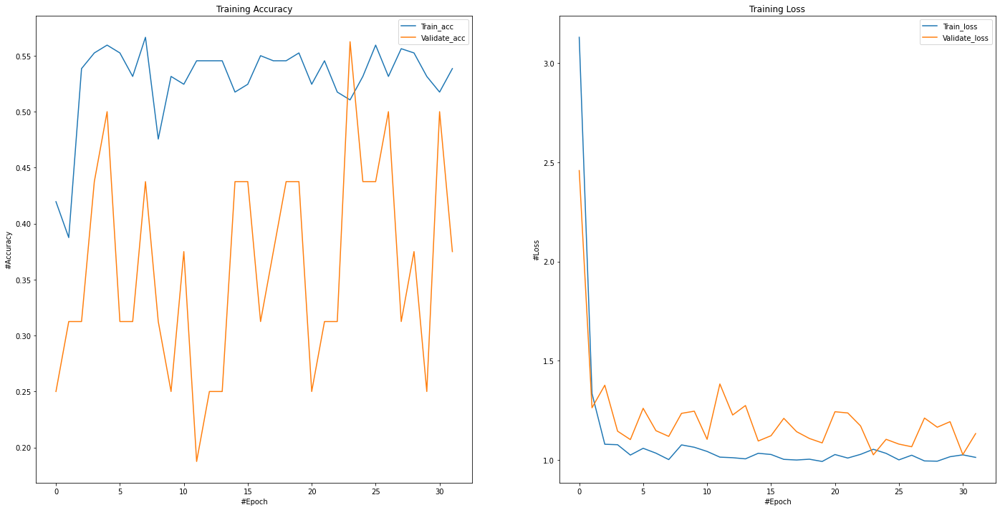

In [9]:
# Performance Visualization

plt.rcParams['figure.figsize'] = [24, 12]
# View Accuracy (Training, Validation)
plt.subplot(1, 2, 1)
plt.plot(history.history["accuracy"], label="Train_acc")
plt.plot(history.history["val_accuracy"], label="Validate_acc")
plt.title("Training Accuracy")
plt.legend(["Train_acc", "Validate_acc"])
plt.xlabel("#Epoch")
plt.ylabel("#Accuracy")

# View Loss (Training, Validation)
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label="Train_loss")
plt.plot(history.history['val_loss'], label="Validate_loss")
plt.title("Training Loss")
plt.legend(["Train_loss", "Validate_loss"])
plt.xlabel("#Epoch")
plt.ylabel("#Loss")
plt.show()

Found 16 images belonging to 3 classes.
[0 0 0 0 0 1 1 1 1 1 1 2 2 2 2 2]


C:\Users\User\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\training.py:1976: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


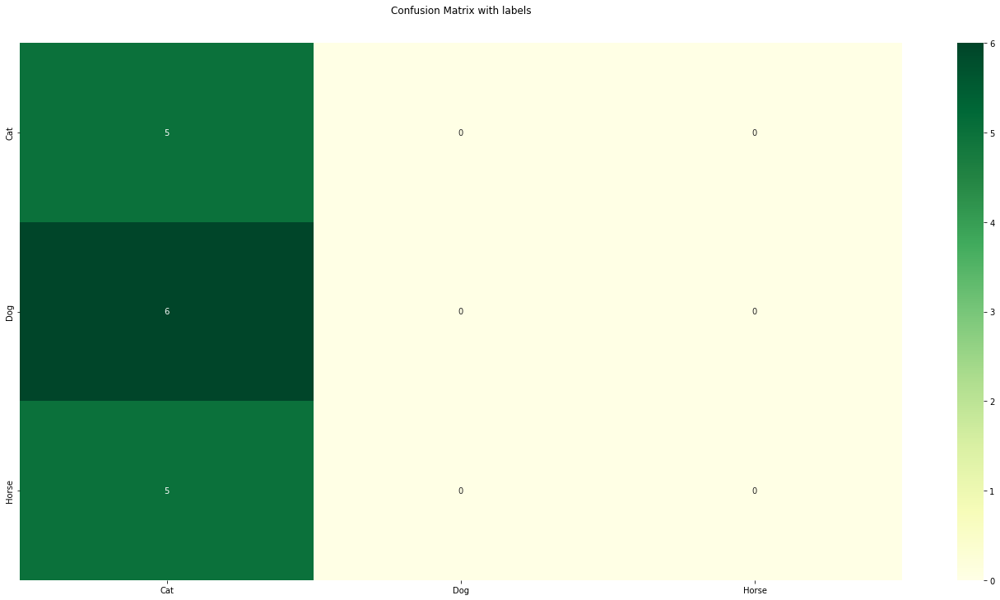

Classification report between y_true and df_class
              precision    recall  f1-score   support

           0       0.31      1.00      0.48         5
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         5

    accuracy                           0.31        16
   macro avg       0.10      0.33      0.16        16
weighted avg       0.10      0.31      0.15        16



C:\Users\User\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif

In [10]:
# Initial test generator
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory('./Cat_Dog_Horse/Test',
                                                  class_mode="categorical",
                                                  target_size=(224, 224), color_mode="rgb",
                                                  shuffle=False, seed=508,
                                                  batch_size=1)

y_true = test_generator.classes
print(y_true)

# predict 1 image at a time for total predict images = len(y_true) # number of real class
test_generator.reset()
pred_prob = []
for i in range(len(y_true)) :
    pred = model.predict_generator(test_generator.next()[0], verbose=0)
    pred_prob.append(np.array(pred[0]))

# Get classID from max prob(pred_prob)
df_pred = pd.DataFrame(pred_prob)
df_class = df_pred.idxmax(axis=1)

# Calculate confusion matrix, classification report between y_true and df_class
ax = sns.heatmap(confusion_matrix(y_true, df_class), annot=True, cmap='YlGn')

ax.set_title('Confusion Matrix with labels\n\n');
## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['Cat','Dog','Horse'])
ax.yaxis.set_ticklabels(['Cat','Dog','Horse'])

## Display the visualization of the Confusion Matrix.
plt.show()

print("Classification report between y_true and df_class")
print(classification_report(y_true, df_class))
print("============================================")
